# Load Functions

## 0. imports

In [1]:
from reportlab.lib.styles import ParagraphStyle, getSampleStyleSheet
from reportlab.lib.pagesizes import A4
from reportlab.lib import colors
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle, Image, PageBreak
from reportlab.lib.utils import ImageReader
import os
import io
# import mne
# import json

from utils import *
from eeg_qc import compute_eeg_pipeline, test_eeg_pipeline
from ecg_qc import ecg_qc 
from eda_qc import eda_qc
from rsp_qc import *
from mic_qc import *
from lsl_problem import *
from et_qc import *
from webcam_qc import *
from behavior_qc import *
from generate_csv import *
# import matplotlib

In [101]:
# subject = "P5943825"
# xdf_filename = f'/Users/bryan.gonzalez/CUNY_subs/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'

subject = "P5070899"
xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'
#xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'

# subject = "P5597531"
# xdf_filename =  f'/Users/apurva.gokhe/Documents/CUNY_QC/data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_MOBI.xdf'

video_filename = '/'.join(xdf_filename.split('/')[:-1]) + f'/sub-{subject}_task-CUNY_run-001_video.avi'


## Stim + Behavior

In [102]:
stim_df = import_stim_data(xdf_filename)

In [103]:
error_log = []

In [104]:
behavior_vars, behavior_error = behavior_qc(xdf_filename, stim_df)

Missing stimulus markers: ['None']
Duration of experiment: 2123.1963913093205s
Durations do not match expected stimuli length: ['Onset_Tornado', 'Onset_BirthdayParty']
299.99868434970267
Is Resting state of expected duration? True
300.4952121282113
Is Social script of expected duration? True
Duration of Impedance check: 334.96527331118705s
Are all 10 seconds rest equal? True
Average response time across all story listening tasks: 23.27912847173866s


In [105]:
if behavior_error and 'Offset_Experiment' in behavior_vars["missing_stimulus_markers"]:
    behavior_print = f'Missing data error: Missing stimulus markers including Offset_Experiment for participant {subject} in {xdf_filename}.<br/> \
                      Missing stimulus markers: {behavior_vars["missing_stimulus_markers"]}'
    error_log.append(behavior_print)

# if missing stim markers but not missing Offset Experiment
elif behavior_error:
    behavior_print = f'Missing data error: Missing stimulus markers for participant {subject} in {xdf_filename}.<br/> \
        Missing stimulus markers: {behavior_vars["missing_stimulus_markers"]}'
    error_log.append(behavior_print)
else:
    behavior_print = {
        "Missing stimulus markers": ("missing_stimulus_markers", behavior_vars["missing_stimulus_markers"]),
        "Duration of experiment": ("total_duration", f'{behavior_vars["total_duration"]:.4f} s'),
        "Durations do not match expected length": ("unexpected_durations", behavior_vars["unexpected_durations"]),
        "Duration of impedence check": ("impedance_check_duration", f'{behavior_vars["impedance_check_duration"]:.4f} s'),
        "Are all 10 seconds rest equal?": ("ten_seconds_rest", behavior_vars["ten_seconds_rest"]),
        "Average response time across all story listening task": ("average_response_time", f'{behavior_vars["average_response_time"]:.4f} s')
    }

In [106]:
behavior_print

{'Missing stimulus markers': ('missing_stimulus_markers', ['None']),
 'Duration of experiment': ('total_duration', '2123.1964 s'),
 'Durations do not match expected length': ('unexpected_durations',
  ['Onset_Tornado', 'Onset_BirthdayParty']),
 'Duration of impedence check': ('impedance_check_duration', '334.9653 s'),
 'Are all 10 seconds rest equal?': ('ten_seconds_rest', True),
 'Average response time across all story listening task': ('average_response_time',
  '23.2791 s')}

# Get Metrics

## 1. EEG

Creating RawArray with float64 data, n_channels=128, n_times=299988
    Range : 0 ... 299987 =      0.000 ...   299.997 secs
Ready.
Creating RawArray with float64 data, n_channels=1, n_times=299988
    Range : 0 ... 299987 =      0.000 ...   299.997 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
STARTING preprocessing
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished


Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished


Removed notch frequencies (Hz):
     60.00 : 7482 windows
    120.00 : 7482 windows
    180.00 : 7482 windows
    239.00 : 7482 windows
    240.00 : 7482 windows
    241.00 : 7482 windows
    299.00 : 7482 windows
    300.00 : 7482 windows
    301.00 : 7482 windows
    359.00 : 7482 windows
    360.00 : 7482 windows
    361.00 : 7482 windows
    419.00 : 7482 windows
    420.00 : 7482 windows
    421.00 : 7482 windows
    479.00 : 7482 windows
    480.00 : 7482 windows
    481.00 : 7482 windows
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.6s finished


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 26
Total # of chunks: 5
Current chunk:
1
2
3
4
5

RANSAC done!


2025-09-29 11:36:23,157 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E8', 'E21'], 'bad_by_hf_noise': ['E31', 'E35'], 'bad_by_correlation': [], 'bad_by_SNR': [], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E31'), np.str_('E126')], 'bad_all': ['E8', 'E21', 'E35', np.str_('E126'), 'Cz', 'E31']}


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 22
Total # of chunks: 6
Current chunk:
1
2
3
4
5
6

RANSAC done!


2025-09-29 11:37:19,426 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E8'], 'bad_by_hf_noise': ['E40', 'E35', 'E33', 'E34', 'E46', 'E45'], 'bad_by_correlation': [], 'bad_by_SNR': [], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E126'), np.str_('E1')], 'bad_all': ['E8', 'E40', 'E35', 'E33', 'E34', 'E46', np.str_('E126'), np.str_('E1'), 'E45', 'Cz']}


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 119 sensor positions
Interpolating 10 sensors


2025-09-29 11:37:19,884 - pyprep.reference - INFO - Iterations: 1


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 32
Total # of chunks: 4
Current chunk:
1
2
3
4

RANSAC done!


2025-09-29 11:38:58,979 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E8', 'E21', 'E14'], 'bad_by_hf_noise': ['E41', 'E28', 'E40', 'E35', 'E46', 'E34', 'E33', 'E45', 'E27'], 'bad_by_correlation': [], 'bad_by_SNR': [], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E126'), np.str_('E1')], 'bad_all': ['E8', 'E21', 'E41', 'E28', 'E14', 'E40', 'E35', 'E46', 'E34', 'E33', np.str_('E126'), np.str_('E1'), 'E45', 'Cz', 'E27']}


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 114 sensor positions
Interpolating 15 sensors


2025-09-29 11:38:59,426 - pyprep.reference - INFO - Iterations: 2


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 42
Total # of chunks: 3
Current chunk:
1
2
3

RANSAC done!


2025-09-29 11:40:35,066 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E8', 'E21', 'E14'], 'bad_by_hf_noise': ['E41', 'E28', 'E40', 'E35', 'E46', 'E34', 'E33', 'E45', 'E27'], 'bad_by_correlation': [], 'bad_by_SNR': [], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E126'), np.str_('E1')], 'bad_all': ['E8', 'E21', 'E41', 'E28', 'E14', 'E40', 'E35', 'E46', 'E34', 'E33', np.str_('E126'), np.str_('E1'), 'E45', 'Cz', 'E27']}
2025-09-29 11:40:35,067 - pyprep.reference - INFO - Robust reference done


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 114 sensor positions
Interpolating 15 sensors
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 42
Total # of chunks: 3
Current chunk:
1
2
3

RANSAC done!
Found 10 uniquely bad channels:

0 by NaN: []

0 by flat: []

3 by deviation: ['E8', 'E14', 'E21']

7 by HF noise: ['E27', 'E28', 'E33', 'E34', 'E35', 'E40', 'E41']

0 by correlation: []

0 by SNR: []

0 by dropout: []

0 by RANSAC: []

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 118 sensor positions
Interpolating 11 sensors
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.4s finished


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 43
Total # of chunks: 3
Current chunk:
1
2
3

RANSAC done!
DONE with preprocessing
Bad channels before robust reference: ['E8', 'E21', 'E35', np.str_('E126'), 'Cz', 'E31']
Interpolated channels: ['E8', 'E21', 'E41', 'E28', 'E14', 'E33', 'E34', 'E35', 'E40', 'Cz', 'E27']
Bad channels after interpolation: [np.str_('E126'), 'E41']
Using EOG channels: E25, E8
EOG channel index for this subject is: [24  7]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel E25 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


2 bad epochs dropped
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 95 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 95.00
- Lower transition bandwidth: 23.75 Hz (-6 dB cutoff frequency: 83.12 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 139 samples (0.139 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.7s finished


Setting up low-pass filter at 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 1651 samples (1.651 s)

Percent Good Data: 93.37%
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 6601 samples (6.601 s)



[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.4s finished


Fitting ICA to data using 127 channels (please be patient, this may take a while)
Omitting 19918 of 299988 (6.64%) samples, retaining 280070 (93.36%) samples.
Selecting by explained variance: 8 components
Fitting ICA took 3.2s.


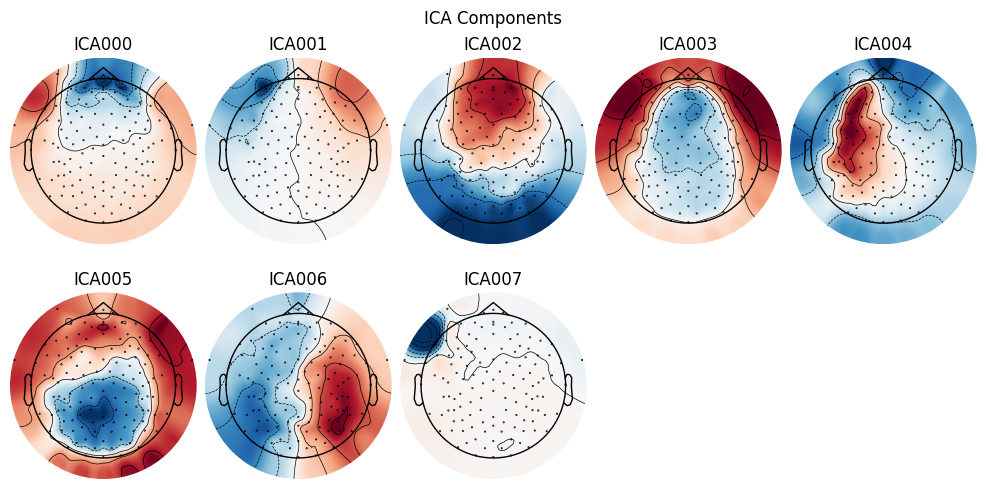

Applying ICA to Raw instance
    Transforming to ICA space (8 components)
    Zeroing out 2 ICA components
    Projecting back using 127 PCA components
Writing /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5070899/sub-P5070899_ses-S001_task-CUNY_run-001_eeg_clean.fif
Closing /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5070899/sub-P5070899_ses-S001_task-CUNY_run-001_eeg_clean.fif
[done]
Using matplotlib as 2D backend.


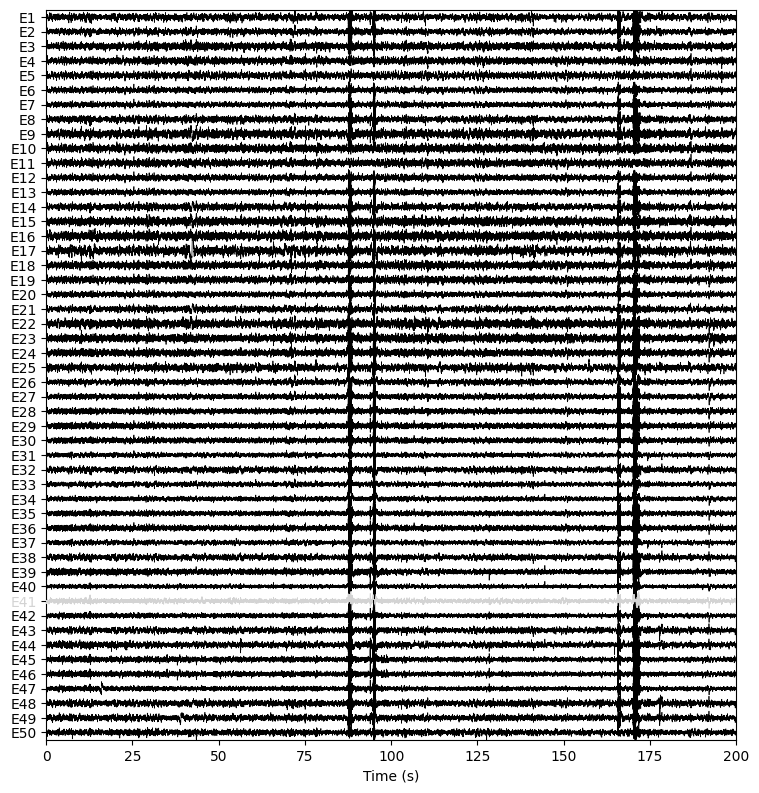

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).


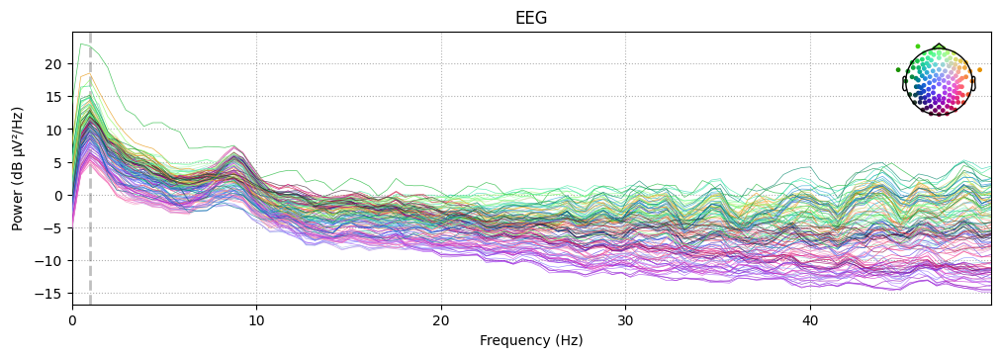

In [107]:
#Compute the eeg vars
eeg_vars, eeg_df, eeg_error = compute_eeg_pipeline(xdf_filename, 
                                                          stim_df=stim_df, 
                                                          task='RestingState')


In [108]:
if eeg_error:
    eeg_print = f'No EEG data was found for participant {subject} in {xdf_filename}.'
    error_log.append(eeg_print)
else:
    eeg_print = {
        "Event": ("event", f'{eeg_vars["event"]}'),
        "Bad channels before robust reference": ("bad_channels_before", eeg_vars["bad_channels_before"]), 
        "Interpolated channels": ("interpolated_channels", eeg_vars["interpolated_channels"]), 
        "Bad channels after interpolation": ("bad_channels_after", eeg_vars["bad_channels_after"]), 
        "Percent Good before artifact removal": ("percent_good", f'{eeg_vars["percent_good"]:.4}%'),
        "Artifactual Components Excluded": ("excluded_components", f'{eeg_vars["excluded_components"]}')
    }

## 2. ECG

Effective sampling rate: 500.14558143487386
Percent missing data: 0.0000%
Average heart rate: 60.41199378159254
Kurtosis signal quality index: 0.11842223696817822
Power spectrum distribution signal quality index: 0.9600878083282905
Relative power in baseline signal quality index: 1.9885655104482636
Signal to Noise Ratio: 3.6311300980508543


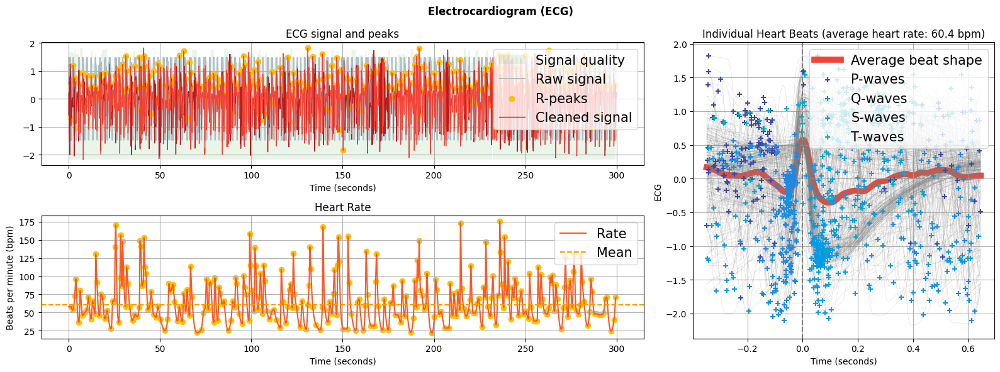

In [109]:
[ecg_vars, ps_df, ecg_error] = ecg_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='RestingState')

In [110]:
if ecg_error:
    ecg_print = f"No ECG data was found for participant {subject} in {xdf_filename}."
    error_log.append(ecg_print)
else:
    ecg_print = {
        "Event": ("event", f'{ecg_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{ecg_vars["sampling_rate"]:.4f} Hz'), 
        "Percent of data missing": ("percent_missing", f'{ecg_vars["percent_missing"]:.4}%'),
        "Signal to Noise Ratio": ("SNR", f'{ecg_vars["SNR"]:.4f} dB'),
        "Average heart rate": ("average_heart_rate", f'{ecg_vars["average_heart_rate"]:.4f} bpm'),
        "Kurtosis signal quality index (kSQI)": ("kurtosis_SQI", f'{ecg_vars["kurtosis_SQI"]:.4f}'),
        "Power spectrum distribution (pSQI)": ("power_spectrum_distribution_SQI", f'{ecg_vars["power_spectrum_distribution_SQI"]:.4f} mV²/Hz'),
        "Relative power in baseline (basSQI)": ("relative_baseline_power_sqi", f'{ecg_vars["relative_baseline_power_sqi"]:.4f}%')
    }

## 3. EDA

Effective sampling rate: 500.146 Hz
Percent missing data: 0.0000%
Signal Integrity Check: 100.000 %
Average Skin Conductance Level: 0.280 mS
Skin Conductance Level Standard deviation: 0.015 mS
Skin Conductance Level Coefficient of Variation: 5.433 %
Average Amplitude of Skin Conductance Response: 0.001 mS
Skin Conductance Response Validity: 0.000 %
Signal to Noise Ratio: 23.218 dB
0        1970-01-06 15:11:54.153482133
1        1970-01-06 15:11:54.155481551
2        1970-01-06 15:11:54.157480969
3        1970-01-06 15:11:54.159480387
4        1970-01-06 15:11:54.161479805
                      ...             
150038   1970-01-06 15:16:54.142133116
150039   1970-01-06 15:16:54.144132534
150040   1970-01-06 15:16:54.146131952
150041   1970-01-06 15:16:54.148131369
150042   1970-01-06 15:16:54.150130787
Name: lsl_time_stamp, Length: 150043, dtype: datetime64[ns]


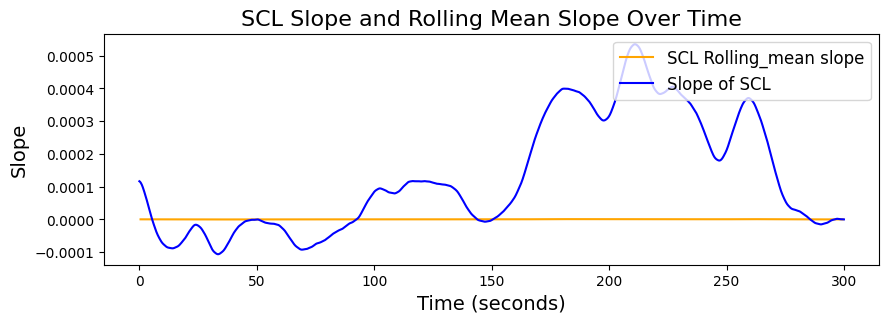

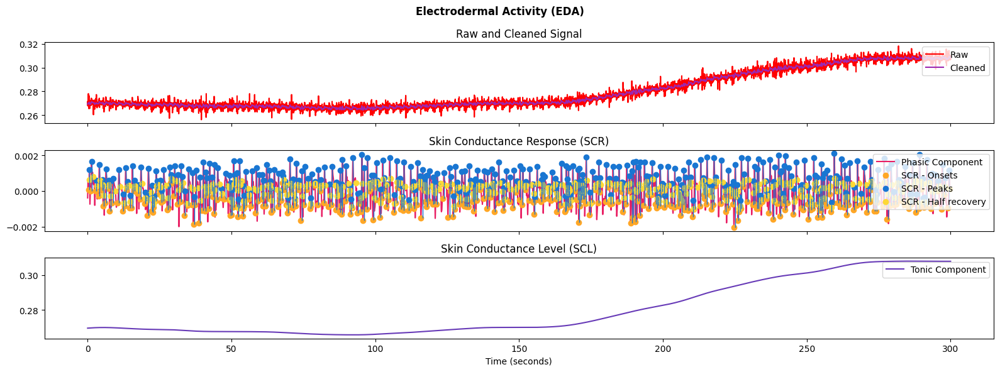

In [111]:
[eda_vars, ps_df, eda_error] = eda_qc(xdf_filename = xdf_filename, stim_df = stim_df, task= 'RestingState')

In [112]:
if eda_error:
    eda_print = f"No EDA data was found for participant {subject} in {xdf_filename}."
    error_log.append(eda_print)
else:
    eda_print = {
        "Event": ("event", f'{eda_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{eda_vars["sampling_rate"]:.4f} Hz'), 
        "Percent of data missing": ("percent_missing", f'{eda_vars["percent_missing"]:.4}%'),
        "Signal to noise ratio": ("snr", f'{eda_vars["snr"]:.4f} dB'),
        "Signal integrity check": ("signal_integrity_check", f'{eda_vars["signal_integrity_check"]:.4f}%'),
        "Average skin conductance level": ("average_scl", f'{eda_vars["average_scl"]:.4f} mS'),
        "Skin conductance level std": ("scl_sd", f'{eda_vars["scl_sd"]:.4f} mS'),
        "Skin conductance level coefficient of variation": ("scl_cv", f'{eda_vars["scl_cv"]:.4f}%'),
        "Average amplitude of skin conductance response": ("average_scr_amplitude", f'{eda_vars["average_scr_amplitude"]:.4f} mS'),
        "Skin conductance response validity": ("scr_validity", f'{eda_vars["scr_validity"]:.4f}%')
    }

## 4. RSP

Effective sampling rate: 500.1456
Percent missing data: 0.0000%
Signal to Noise Ratio: 13.9795
Breath amplitude mean: 0.4074
Breath amplitude std: 0.0729
Breath amplitude range: 0.2250 - 0.8549
Respiration rate mean: 23.6018
Respiration rate std: 1.8093
Respiration rate range: 18.5249 - 27.0359
Peak to peak interval mean: 2.5932
Peak to peak interval std: 0.5988
Peak to peak interval range: 1.5356 - 4.8946
Baseline drift: 0.0152
Autocorrelation at typical breath cycle: 0.5111


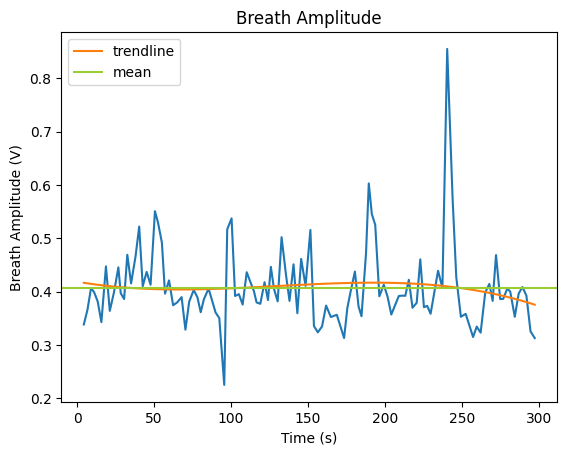

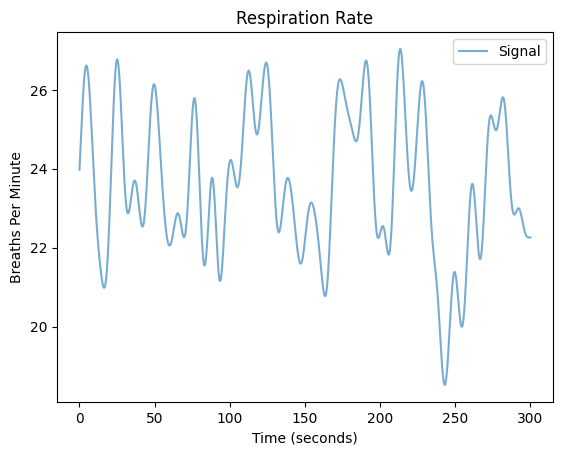

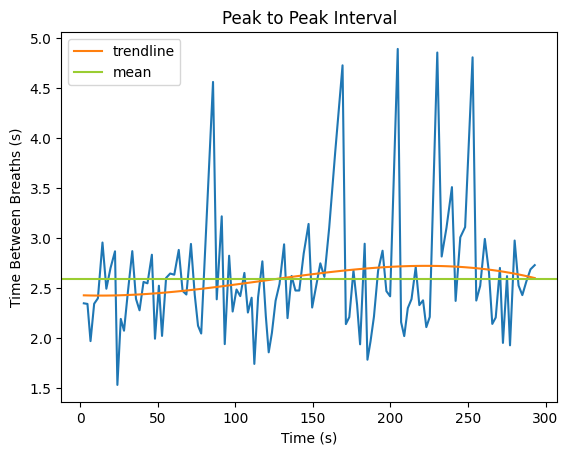

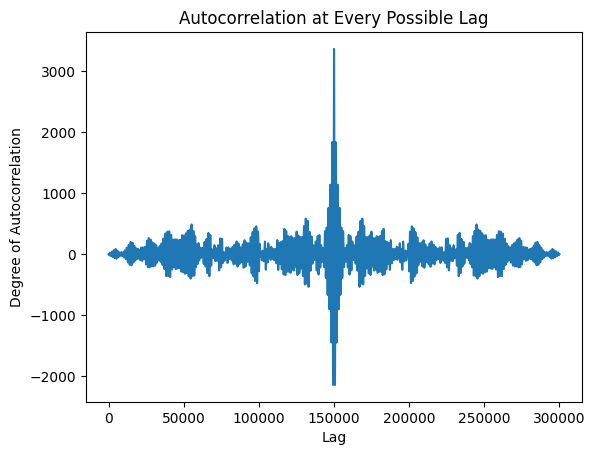

In [113]:
rsp_vars, ps_df, rsp_error = rsp_qc(xdf_filename=xdf_filename, stim_df=stim_df, task='RestingState')

In [114]:
if rsp_error:
    rsp_print = f"No RSP data was found for participant {subject} in {xdf_filename}."
    error_log.append(rsp_print)
else:
    rsp_print = {
        "Event": ("event", f'{rsp_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{rsp_vars["sampling_rate"]:.4f} Hz'), 
        "Signal to noise ratio": ("rsp_snr", f'{rsp_vars["rsp_snr"]:.4f} dB'),
        "Breath amplitude mean": ("breath_amplitude_mean", f'{rsp_vars["breath_amplitude_mean"]:.4f} V'),
        "Breath amplitude std": ("breath_amplitude_std", f'{rsp_vars["breath_amplitude_std"]:.4f} V'),
        "Breath amplitude min": ("breath_amplitude_min", f'{rsp_vars["breath_amplitude_min"]:.4f} V'),
        "Breath amplitude max": ("breath_amplitude_max", f'{rsp_vars["breath_amplitude_max"]:.4f} V'),
        "Respiration rate mean": ("rsp_rate_mean", f'{rsp_vars["rsp_rate_mean"]:.4f} bpm'),
        "Respiration rate std": ("rsp_rate_std", f'{rsp_vars["rsp_rate_std"]:.4f} bpm'), 
        "Respiration rate min": ("rsp_rate_min", f'{rsp_vars["rsp_rate_min"]:.4f} bpm'), 
        "Respiration rate max": ("rsp_rate_max", f'{rsp_vars["rsp_rate_max"]:.4f} bpm'), 
        "Peak to peak interval mean": ("ptp_mean", f'{rsp_vars["ptp_mean"]:.4f} sec'), 
        "Peak to peak interval std": ("ptp_std", f'{rsp_vars["ptp_std"]:.4f} sec'), 
        "Peak to peak interval min": ("ptp_min", f'{rsp_vars["ptp_min"]:.4f} sec'), 
        "Peak to peak interval max": ("ptp_max", f'{rsp_vars["ptp_max"]:.4f} sec'), 
        "Baseline drift": ("baseline_drift", f'{rsp_vars["baseline_drift"]:.4f} V'), 
        "Autocorrelation at typical breath cycle": ("autocorrelation", f'{rsp_vars["autocorrelation"]:.4f}')
    }

## 5. Mic

Effective sampling rate: 44099.2296
Difference between .wav file and lsl timestamps durations: 90.0550
number of NaN's: 0 
percent of NaN's: 0.0000%
mic samples first quartile: -27.0 
mic samples third quartile: 26.0
mic samples standard deviation: 132.8120
mic samples min: -8675 
mic samples max: 7355


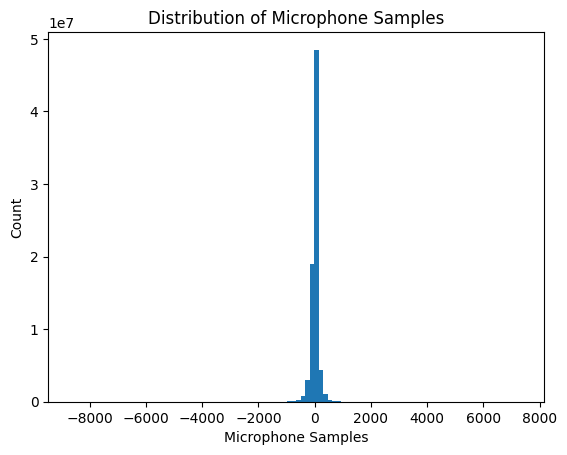

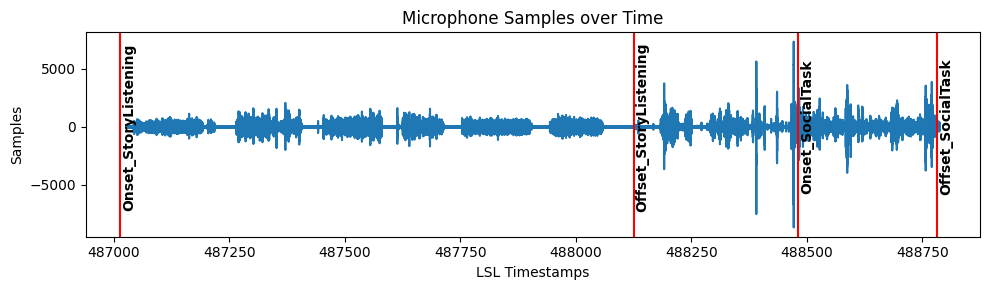

In [115]:
mic_vars, mic_df, mic_error = mic_qc(xdf_filename=xdf_filename, stim_df=stim_df)

In [116]:
if mic_error:
    mic_print = f"No mic data was found for participant {subject} in {xdf_filename}."
    error_log.append(mic_print)

else:
    mic_print = {
        "Event": ("event", f'{mic_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{mic_vars["sampling_rate"]:.4f} Hz'), 
        "Difference between .wav file and lsl timestamps durations": ("lsl_wav_duration_diff", f'{mic_vars["lsl_wav_duration_diff"]:.4f} sec'), 
        "Number of NaN's": ("num_NaN", f'{mic_vars["num_NaN"]}'),
        "Percent of NaN's": ("percent_NaN", f'{mic_vars["percent_NaN"]:.4f}%'),
        "Mic samples first quartile": ("quan25", f'{mic_vars["quan25"]:.4f}'),
        "Mic samples third quartile": ("quan75", f'{mic_vars["quan75"]:.4f}'),
        "Mic samples std": ("std", f'{mic_vars["std"]:.4f}'),
        "Mic samples min": ("min", f'{mic_vars["min"]:.4f}'),
        "Mic samples max": ("max", f'{mic_vars["max"]:.4f}')
        }

## 6. Webcam

RestingState duration matches camera duration!
RestingState:  299.99868434970267
Webcam Stream:  299.9478845159174


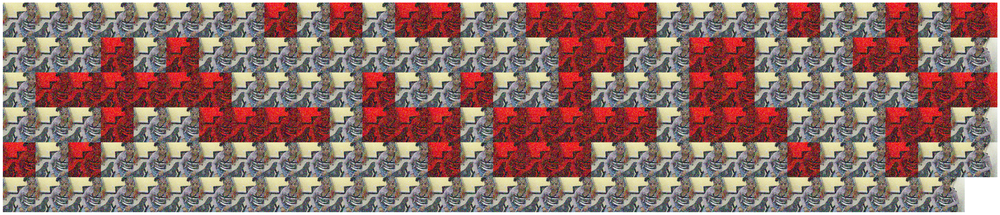

In [117]:
webcam_vars, webcam_df, webcam_error = webcam_qc(xdf_filename=xdf_filename,
                                stim_df=stim_df,
                                video_file=video_filename, task='RestingState')

In [118]:
if webcam_error:
    webcam_print = f"No webcam data was found for participant {subject} in {xdf_filename}."
    error_log.append(webcam_print)
else:
    webcam_print = {
        "Event": ("event", f'{webcam_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{webcam_vars["sampling_rate"]:.4f} Hz'), 
        "Collected full resting state": ("collected_full_RestingState", webcam_vars["collected_full_RestingState"]), 
        "Percent of frames with face detected": ("face_perc", f'{webcam_vars["face_perc"]:.4}%')
    }

## 7. ET

Effective sampling rate: 119.9957
Percent invalid data in left gaze point: 63.58%
Percent invalid data in right gaze point: 58.52%
Percent invalid data in left gaze origin: 63.32%
Percent invalid data in right gaze origin: 58.15%
Percent invalid data in left pupil diameter: 63.58%
Percent invalid data in right pupil diameter: 58.52%
Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter): True
Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point)): True
Mean difference in percent valid data between right and left eyes: 5.115%
Percent of data with gaze point differences of over 0.2 mm: 3.651%


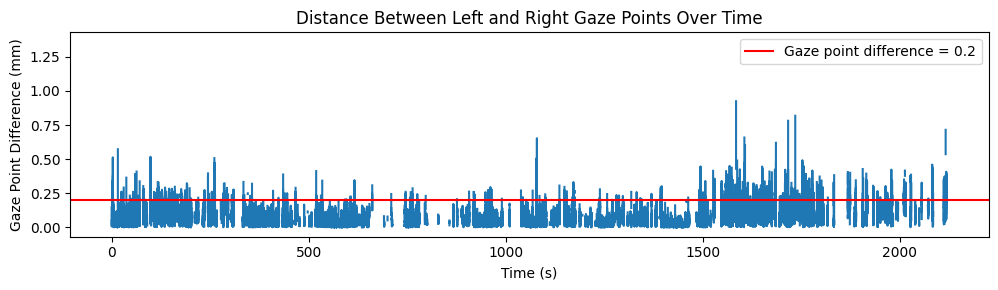

In [119]:
et_vars, et_df, et_error = et_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='Experiment')

In [120]:
if et_error == 'no_data':
    et_print = f"No ET data was found for participant {subject} in {xdf_filename}."
    error_log.append(et_print)
else:
    et_print = {
        "Event": ("event", f'{et_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{et_vars["sampling_rate"]:.4f} Hz'), 
        "Percent invalid data in left gaze point": ("left_gaze_point_invalid", f'{et_vars["left_gaze_point_invalid"]:.4}%'),
        "Percent invalid data in right gaze point": ("right_gaze_point_invalid", f'{et_vars["right_gaze_point_invalid"]:.4}%'),
        "Percent invalid data in left gaze origin": ("left_gaze_origin_invalid", f'{et_vars["left_gaze_origin_invalid"]:.4}%'),
        "Percent invalid data in right gaze origin": ("right_gaze_origin_invalid", f'{et_vars["right_gaze_origin_invalid"]:.4}%'),
        "Percent invalid data in left pupil diameter": ("left_pupil_invalid", f'{et_vars["left_pupil_invalid"]:.4}%'),
        "Percent invalid data in right pupil diameter": ("right_pupil_invalid", f'{et_vars["right_pupil_invalid"]:.4}%'),
        "Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter)": ("xyz_measures_check", et_vars["xyz_measures_check"]), 
        "Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point))": ("coordinate_system_check", et_vars["coordinate_system_check"]),
        "Mean difference in percent valid data between right and left eyes": ("LR_mean_diff", f'{et_vars["LR_mean_diff"]:.4f}%'),
        "Percent of data with gaze point differences of over 0.2 mm": ("percent_over02", f'{et_vars["percent_over02"]:.4f}%')
        }
if et_error == 'missing_data':
    error_log.append(f"Significant amount of ET data missing for participant {subject} in {xdf_filename}.")
    et_print["Percent of data with gaze point differences of over 0.2 mm"] = float('nan')


## Stream Durations 

### functions are in utils.py (but should be called in the report)

In [121]:
ps_error = False
if ecg_error + eda_error + rsp_error == 3:
    ps_error = True

In [122]:
df_map = {
    'et': et_df,
    'ps': ps_df,
    'mic': mic_df,
    'cam': webcam_df,
    'eeg': eeg_df
    }

error_map = {
    'et': et_error,
    'ps': ps_error,
    'mic': mic_error,
    'cam': webcam_error,
    'eeg': eeg_error
    }

In [123]:
duration_vars = {"Durations of each modality + comparison to expected duration:": 
    get_durations(xdf_path=xdf_filename, task='Experiment', stim_df = stim_df, df_map = df_map, error_map = error_map)}

mic is shorter than expected for Experiment by 364.1519 seconds

Experiment DataFrame


In [124]:
duration_print = duration_vars

In [125]:
duration_print

{'Durations of each modality + comparison to expected duration:':      stream   duration    mm:ss  percent
 2       mic  1759.0445  0:29:19  82.8489
 0        et  2122.9253  0:35:23  99.9872
 3       cam  2123.1520  0:35:23  99.9979
 1        ps  2123.1938  0:35:23  99.9999
 4       eeg  2123.1955  0:35:23    100.0
 5  expected  2123.1964  0:35:23    100.0}

In [126]:
# i wont run these but they are here for reference
# get_durations('RestingState', xdf_filename)
# get_durations('CampFriend', xdf_filename)
# get_durations('SocialTask', xdf_filename)
# whole_durations(xdf_filename, stim_df, df_map, error_map)

## LSL Problem

In [127]:
lsl_vars = lsl_problem_qc(xdf_filename, stim_df=stim_df, df_map=df_map, error_map = error_map)

    subject stream  num_losses  percent_lost
0  P5070899     et           0             0
1  P5070899     ps           0             0
2  P5070899    mic           0             0
3  P5070899    cam           0             0
4  P5070899    eeg           0             0
    subject stream  num_losses  percent_lost
0  P5070899     et           0           0.0
1  P5070899     ps           0           0.0
2  P5070899    mic           0           0.0
3  P5070899    cam           0           0.0
4  P5070899    eeg           0           0.0


In [128]:
def unpack_vars(lsl_vars, duration_vars):
    # Unpack lsl vars
    lsl_prob_vars = {}
    stream_vars = {}

    for key in lsl_vars.keys():
        if isinstance(lsl_vars[key], pd.DataFrame):
            lsl_k = lsl_vars[key].to_dict(orient='records')
            for i in range(len(lsl_k)):
                lsl_dict = {f"{lsl_k[i]['stream']}_{k}": v for k, v in lsl_k[i].items() if k != "stream" and k!='subject'}
                lsl_prob_vars.update(lsl_dict)
        else:
            lsl_prob_vars.update({key:lsl_vars[key]})
    
    # Unpack stream durations
    stream = duration_vars['Durations of each modality + comparison to expected duration:'].to_dict(orient='records')
    stream_vars = {}
    for i in range(len(stream)):
        stream_dict = {f"{stream[i]['stream']}_{k}": v for k, v in stream[i].items() if k != "stream"}
        stream_vars.update(stream_dict)
    return lsl_prob_vars, stream_vars

In [129]:
lsl_vars_unpacked, duration_vars_unpacked = unpack_vars(lsl_vars, duration_vars)

In [130]:
lsl_print = {}
for key in lsl_vars_unpacked.keys():
    # separate modality and metric description and replace with a space and modality first uppercase
    # if modalty not in expected, upper! else first upper
    modality, metric, _ = key.split("_")
    value = lsl_vars_unpacked[key]
    if metric == "num":
        label = f'Number of {modality} lsl losses'
        lsl_print[label] = (key, value)
    elif metric == "percent":
        label = f'Percent of {modality} lsl loss'
        lsl_print[label] = (key, f'{value:.4}%')

In [131]:
duration_print = {}
for key in duration_vars_unpacked.keys():
    # separate modality and metric description and replace with a space and modality first uppercase
    # if modalty not in expected, upper! else first upper
    modality, metric = key.split("_")
    if modality not in ['expected']:
        modality = modality.upper()
    else:
        modality = modality.capitalize()
    label = f'{modality} {metric}'
    value = duration_vars_unpacked[key]
    if metric == 'duration':
        duration_print[label] = (key, f'{value:.4f} s')
    elif metric == 'percent':
        duration_print[label] = (key, f'{value:.4}%')
    

In [132]:
duration_print_table = duration_vars

In [133]:
# find a better solution if we do this
duration_print_table = {
    'Durations of each modality + comparison to expected duration:': ("whatever", duration_vars["Durations of each modality + comparison to expected duration:"])    
}

In [134]:
lsl_print_table = {
    # "Percent of missing data in entire experiment:": ("percent_loss", lsl_vars["percent_loss"]),
    "Percent of missing data before social task offset:": ("loss_before_social_task", lsl_vars["loss_before_social_task"])
}

# Add to CSV/Make IQR Plot

In [135]:
unnamed_modality_vars = {
    'behavior': behavior_vars,
    'eeg': eeg_vars, 
    'et': et_vars, 
    'ecg': ecg_vars, 
    'eda': eda_vars, 
    'rsp': rsp_vars, 
    'mic': mic_vars, 
    'cam': webcam_vars,
    'lsl': lsl_vars_unpacked, 
    'duration': duration_vars_unpacked
    }

def add_modality_name(modality_vars):
    for key, vars in modality_vars.items():
        # if key not in ['duration', 'lsl']:
        new_vars = {(f"{key}_{k}" if (key not in k) or key == 'duration' else k): value for k, value in vars.items()} # THIS IS IMPORTANT
        modality_vars[key] = new_vars

    return modality_vars

    
modality_vars = add_modality_name(unnamed_modality_vars)

generate_csv(xdf_filename, modality_vars)

2


('IQR cannot be calculated due to insufficient participant data.', 'Saved')

In [136]:
def make_iqr_plot(variable):
    if os.path.exists('CUNY_QC.csv') == False:
        return 'QC metric csv file does not exist.'
    else:
    
        fig, ax = plt.subplots(figsize=(4, 1.5))
        sns.boxplot(x=qc_csv[variable], color="paleturquoise", width=0.2, ax=ax)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        modality = variable.split('_')[0]
        subject_value = modality_vars[modality][variable]
        if isinstance(subject_value, (float, np.floating, int)):
            ax.axvline(subject_value, color="red", linestyle="dotted", linewidth=1)

        ax.text(
            ax.get_xlim()[0], ax.get_ylim()[0],
            f"N={qc_csv.shape[0]}",
            fontsize=10, va="bottom", ha="left"
        )
        ax.set_xlabel(None)
        plt.tight_layout()

        # Save to memory buffer instead of file
        buf = io.BytesIO()
        fig.savefig(buf, format="png", bbox_inches="tight")
        # fig.show()
        buf.seek(0)
        plt.close(fig)

        return buf

In [137]:
modality_captions = {
    'eeg': 'Data preprocessed by performing <b>line noise removal</b>, <b>robust referencing</b>, and <b>bad channel detection/interpolation</b> using PyPrep pipeline. First, the pipeline applies a notch filter at 60 Hz and its harmonics to remove power line noise. Then, it performs <b>robust average referencing</b>, where it detects bad channels, interpolates them using surrounding signals, and computes a median-based reference across EEG channels. This ensures a stable reference even in the presence of noisy electrodes. Independent components analysis (ICA) was then performed to identify and remove ocular and muscle artifacts. The final output is a cleaned EEG dataset with a consistent reference, ready for further analysis.',
    'et': 'In the eye tracking data, gaze origin, gaze point, and pupil diameter are reported, for the left and right eyes. Gaze origin describes the point in 3D space where the gaze vector starts, and is reported in both the user coordinate system (UCS) and the trackbox coordinate system (TBCS). Gaze point describes the spot on the screen where the participant is looking, for each eye. Gaze origin is reported in 3D space in the UCS and the display area. The percent of data for which the distance between the gaze point of the left and right eye is more than 0.2 mm is reported below.',
    'ecg': "The data was processed using the neurokit2 automated pipeline for preprocessing ECG signals. ECG data is cleaned using the default parameters that apply fifth order 0.5 Hz high-pass butterworth filter followed by 50 Hz powerline filtering. Neurokit2 was also used to calculate signal quality indices (SQI) based on Zhao et.al (2018). SQIs calculated were kurtosis (kSQI), power spectrum distribution of QRS wave (pSQI) and relative power in baseline (basSQI). kSQI was calculated using the Fisher's method. pSQI and basSQI were calculated using the Welch method.",
    'eda': "Electrodermal Activity (EDA) is measured in microSiemens from a standard EDA sensor. EDA data quality metrics calculated from raw and clean data using neurokit2 python package. The data is processed using the neurokit2 automated pipeline for preprocessing EDA signal. EDA data is cleaned using the default parameters that apply fourth order butterworth filter. Additionally, the automated preprocessing pipeline was used to decompose the EDA signal into the tonic component, Skin Conductance Level (SCL) and the phasic component, Skin Conductance Response (SCR). The decomposition was done using default parameters that perform high-pass filtering with a cutoff frequency of 0.05Hz on EDA signal.",
    'rsp': "Respiration data is measured in volts from a piezoelectric sensor. Respiration data quality metrics are calculated both from raw and cleaned data, where the neurokit2 package was used to clean the data using the default method of a second order 0.05-3 Hz bandpass Butterworth filter, as in Khodadad et al, 2018. Neurokit2 was also used to extract the peaks and troughs of detected breaths. Respiration rate was calculated using the cross correlation method, which was more consistent to the raw data than the other trough method. Baseline drift was quantified as the standard deviation of the data after applying a lowpass filter to raw data.",
    'mic': "For audio data, it is important to confirm that the distribution of microphone samples (see graph below) is relatively centered around 0, with no outlier peaks and no values above 32,000 or below -32,000.",
    'cam': "The quality of the webcam data is assessed by checking the percentage of frames where a face is detected. If a face is not detected in more than 50 percent of the frames, it may indicate issues with the recording or participant positioning.",
    'duration': "The following table shows the duration of each data modality for the whole experiment and compares it to the duration calculated from the LSL timestamps of corresponding stimulus markers.",
    'lsl': "While the difference between consecutive LSL time stamps are expected to consistently be equal to the inverse of the sampling rate, it was found that there were longer gaps between some LSL time stamps for some data modalities, indicating a potential system or other technical error during data collection. Below, the percentage of missing data for each data modality due to these LSL time stamp gaps is shown. The amount of data in seconds for each modality is also shown below, and each duration is then compared to the expected duration of the experiment.",
    'behavior': "Behavior data metrics were calculated from stimuli markers data."
}

In [138]:
# # UP TO DATE-- REPORT WITHOUT TABLE FORMATTING
# if behavior_error: 
#     all_print_dicts = {
#         "behavior": behavior_print
#     }
# else:
#     all_print_dicts = {
#         "behavior": behavior_print,
#         "eeg": eeg_print,
#         "ecg": ecg_print,
#         "eda": eda_print,
#         "rsp": rsp_print,
#         "mic": mic_print,
#         "et": et_print,
#         "cam": webcam_print,
#         "lsl": lsl_print_table, 
#         "duration": duration_print_table
#     }

# # PDF structure
# parent_folder = xdf_filename.split('mobi')[0]
# pdf_path = f"{parent_folder}Report_NoTable.pdf"
# doc = SimpleDocTemplate(pdf_path, pagesize=A4)
# elements = []
# styles = getSampleStyleSheet()

# # Define subtitle style if not already done
# subtitle_style = ParagraphStyle(
#     name="Subtitle",
#     parent=styles["Heading2"],
#     fontSize=14,
#     leading=16,
#     textColor="gray",
#     spaceAfter=12,
#     alignment=1  # Centered
# )

# # page number function
# def add_page_number(canvas, doc):
#     page_num = f'{canvas.getPageNumber()}'
#     canvas.setFont("Helvetica", 9)
#     canvas.drawRightString(570, 20, page_num)  # (x, y) from bottom-left


# elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
# elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
# elements.append(Spacer(1, 12))

# # Format each metrics dict
# for modality, metric_print_dict in all_print_dicts.items():
#     elements.append(Paragraph(modality.upper(), styles["Heading2"]))
#     if isinstance(metric_print_dict, dict): 
#         elements.append(Paragraph(f'<font color="grey">{modality_captions[modality]}</font>', styles["Normal"]))
#         elements.append(Spacer(1, 12))

#         for key, (variable, value) in metric_print_dict.items():
#             # elements.append(PageBreak())  # Inserts a page break

#             # lsl or duration
#             if isinstance(value, pd.DataFrame):
#                 qc_csv = pd.read_csv('CUNY_QC.csv')
#                 numeric_cols = qc_csv.select_dtypes(include=['float64', 'int64']).columns
#                 if modality == "lsl":
#                     # elements.append(PageBreak())
#                     df_with_plots = value.copy()
#                     num_losses_idx = df_with_plots.columns.get_loc("num_losses")
#                     df_with_plots.insert(num_losses_idx + 1, "num_losses IQR", None)
#                     percent_idx = df_with_plots.columns.get_loc("percent_lost")
#                     df_with_plots.insert(percent_idx + 1, "percent_lost IQR", None)
#                     # to put them at the end:
#                     # df_with_plots["num_losses IQR"] = None  
#                     # df_with_plots["Percent IQR"] = None  

#                     for idx, row in df_with_plots.iterrows():
#                         matching_col_num_losses = [col for col in numeric_cols 
#                                         if f"lsl_{row['stream']}_num_losses" in col] 
#                         matching_col_percent = [col for col in numeric_cols 
#                                         if f"lsl_{row['stream']}_percent_lost" in col]
#                         if matching_col_num_losses:
#                             buffer = make_iqr_plot(matching_col_num_losses[0])
#                             image = ImageReader(buffer)
#                             orig_width, orig_height = image.getSize()
#                             img = Image(buffer, width=orig_width/3, height=orig_height/3)
#                             df_with_plots.at[idx, "num_losses IQR"] = img
#                         if matching_col_percent:
#                             buffer = make_iqr_plot(matching_col_percent[0])
#                             image = ImageReader(buffer)
#                             orig_width, orig_height = image.getSize()
#                             img = Image(buffer, width=orig_width/3, height=orig_height/3)
#                             df_with_plots.at[idx, "percent_lost IQR"] = img
                    
#                     data = [df_with_plots.columns.tolist()] + df_with_plots.values.tolist()  # Include headers
#                     dftable = Table(data, repeatRows=1)
#                     dftable.hAlign = 'CENTER'

#                     dftable.setStyle(TableStyle([
#                         ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
#                         ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
#                         ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
#                         ('FONTSIZE', (0, 0), (-1, -1), 10),
#                         ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
#                     ]))
#                     elements.append(Paragraph(key, styles['Normal']))
#                     elements.append(Spacer(1, 12))

#                     elements.append(dftable)
#                     elements.append(Spacer(1, 12))

#                 elif modality == "duration":
#                     df_with_plots = value.copy()
#                     duration_idx = df_with_plots.columns.get_loc("duration")
#                     df_with_plots.insert(duration_idx + 1, "duration IQR", None)
#                     percent_idx = df_with_plots.columns.get_loc("percent")
#                     df_with_plots.insert(percent_idx + 1, "percent IQR", None)
#                     # to put them at the end:
#                     # df_with_plots["Duration IQR"] = None  
#                     # df_with_plots["Percent IQR"] = None  

#                     for idx, row in df_with_plots.iterrows():
#                         matching_col_duration = [col for col in numeric_cols 
#                                         if f"duration_{row['stream']}_duration" in col] 
#                         matching_col_percent = [col for col in numeric_cols 
#                                         if f"duration_{row['stream']}_percent" in col]
#                         if matching_col_duration:
#                             buffer = make_iqr_plot(matching_col_duration[0])
#                             image = ImageReader(buffer)
#                             orig_width, orig_height = image.getSize()
#                             img = Image(buffer, width=orig_width/3, height=orig_height/3)
#                             df_with_plots.at[idx, "duration IQR"] = img
#                         if matching_col_percent:
#                             buffer = make_iqr_plot(matching_col_percent[0])
#                             image = ImageReader(buffer)
#                             orig_width, orig_height = image.getSize()
#                             img = Image(buffer, width=orig_width/3, height=orig_height/3)
#                             df_with_plots.at[idx, "percent IQR"] = img
                    
#                     data = [df_with_plots.columns.tolist()] + df_with_plots.values.tolist()  # Include headers
#                     dftable = Table(data, repeatRows=1)
#                     dftable.hAlign = 'CENTER'

#                     dftable.setStyle(TableStyle([
#                         ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
#                         ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
#                         ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
#                         ('FONTSIZE', (0, 0), (-1, -1), 10),
#                         ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
#                     ]))
#                     elements.append(Paragraph(key, styles['Normal']))
#                     elements.append(Spacer(1, 12))

#                     elements.append(dftable)
#                     elements.append(Spacer(1, 12))
                
#                 continue
#             # 
#             if modality not in variable:# or modality == 'duration':# and modality not in ['duration', 'lsl']:
#                     variable = f"{modality}_{variable}"

#             text = f"<b>{key}:</b> {value}" 
#             og_value = modality_vars[modality][variable]
#             if not isinstance(og_value, (float, np.floating, int, np.int64)) or isinstance(og_value, bool): 
#                 elements.append(Paragraph(text, styles["Normal"]))
#                 elements.append(Spacer(1, 12))
#             elif variable != 'ecg_percent_missing' and variable != 'eda_percent_missing': # take this out after rerunning
#                 # add IQR imgs
#                 buffer = make_iqr_plot(variable)
#                 image = ImageReader(buffer)
#                 orig_width, orig_height = image.getSize()
#                 img = Image(buffer, width=orig_width/3, height=orig_height/3)
#                 table_data = [[Paragraph(text, styles["Normal"]), img]]
#                 table = Table(table_data, hAlign = 'LEFT', colWidths=[250, orig_width/4])
#                 table.setStyle(TableStyle([
#                     ('ALIGN', (0,0), (-1,-1), 'LEFT'),
#                     ('VALIGN', (0,0), (-1,-1), 'MIDDLE'),
#                     ('LEFTPADDING', (0,0), (-1,-1), 0),
#                     ('RIGHTPADDING', (0,0), (-1,-1), 6)
#                 ]))
#                 elements.append(table)
#                 elements.append(Spacer(1, 12))

#         # images
#         folder = "report_images"
#         if os.path.exists(folder):
#             row_images = []
#             for fname in sorted(os.listdir(folder)):
#                 if modality in fname.lower() and subject in fname:
#                     image_path = os.path.join(folder, fname)
#                     # get dimensions
#                     image_reader = ImageReader(image_path)
#                     orig_width, orig_height = image_reader.getSize()
#                     if orig_width > 4000:
#                         img = Image(image_path, width=orig_width/9, height=orig_height/9)
#                     elif orig_width > 3000:
#                         img = Image(image_path, width=orig_width/7, height=orig_height/7)
#                     elif orig_width > 2000:
#                         img = Image(image_path, width=orig_width/5, height=orig_height/5)
#                     elif orig_width > 1400:
#                         img = Image(image_path, width=orig_width/3, height=orig_height/3)
#                     else:
#                         img = Image(image_path, width=orig_width/2, height=orig_height/2)

#                     # If 'rsp' in image name, add to a row
#                     if 'rsp' in fname.lower():
#                         img.drawWidth = 250
#                         img.drawHeight = 200
#                         row_images.append(img)
                        
#                         if len(row_images) == 2:
#                             table = Table([row_images], hAlign = 'CENTER', colWidths=[280,280])
#                             table.setStyle(TableStyle([('ALIGN', (0, 0), (0, -1), 'LEFT')]))
#                             elements.append(table)
#                             elements.append(Spacer(1, 12))
#                             row_images = []

#                     else:
#                         elements.append(img)
#                         elements.append(Spacer(1, 12))

#             # If there's an unmatched image left in the row buffer
#             if row_images:
#                 elements.append(Table([row_images], hAlign='CENTER', colWidths='*'))
#                 elements.append(Spacer(1, 12))
#         elements.append(Spacer(1, 12))
#     else: # if metric_print is not a dict; this will be true in the case of a modality error
#         elements.append(Paragraph(metric_print_dict, styles["Normal"]))
#         elements.append(Spacer(1, 12))


# doc.build(elements, onFirstPage = add_page_number, onLaterPages = add_page_number)
# print(f'PDF created: {pdf_path}')

In [139]:
# MOST UP TO DATE-- REPORT AS TABLE
if behavior_error: 
    all_print_dicts = {
        "behavior": behavior_print
    }
else:
    all_print_dicts = {
        "behavior": behavior_print,
        "eeg": eeg_print,
        "ecg": ecg_print,
        "eda": eda_print,
        "rsp": rsp_print,
        "mic": mic_print,
        "et": et_print,
        "cam": webcam_print,
        "lsl": lsl_print_table, 
        "duration": duration_print_table
    }

# PDF structure
parent_folder = xdf_filename.split('mobi')[0]
pdf_path = f"{parent_folder}Report_Table.pdf"
doc = SimpleDocTemplate(pdf_path, pagesize=A4)
elements = []
styles = getSampleStyleSheet()

# Define subtitle style if not already done
subtitle_style = ParagraphStyle(
    name="Subtitle",
    parent=styles["Heading2"],
    fontSize=14,
    leading=16,
    textColor="gray",
    spaceAfter=12,
    alignment=1  # Centered
)

styleN = styles["Normal"]
styleN.wordWrap = "CJK"

# page number function
def add_page_number(canvas, doc):
    page_num = f'{canvas.getPageNumber()}'
    canvas.setFont("Helvetica", 9)
    canvas.drawRightString(570, 20, page_num)  # (x, y) from bottom-left


elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
elements.append(Spacer(1, 12))

qc_csv = pd.read_csv('CUNY_QC.csv')
n_pts = qc_csv['Subject'].nunique()
numeric_cols = qc_csv.select_dtypes(include=['float64', 'int64']).columns 

if n_pts < 10:
    elements.append(Paragraph(f"IQR cannot be calculated due to insufficient participant data.", styles["Normal"]))


# Format each metrics dict
for modality, metric_print_dict in all_print_dicts.items():
    elements.append(Paragraph(modality.upper(), styles["Heading2"]))
 
    if isinstance(metric_print_dict, dict): # error handling
        elements.append(Paragraph(f'<font color="grey">{modality_captions[modality]}</font>', styles["Normal"]))
        elements.append(Spacer(1, 12))

        if modality not in ['lsl', 'duration']: 
            df_with_plots = pd.DataFrame.from_dict(metric_print_dict, orient = 'index', columns = ['variable_name', 'metric_value']).reset_index().rename(columns={"index": "metric_label"})
            df_with_plots["IQR Plot"] = None

            data_list = []
            for idx, row in df_with_plots.iterrows():
                variable_name = f'{modality}_{row["variable_name"]}' if modality not in row["variable_name"] else row["variable_name"]
                if isinstance(row['metric_value'], list):
                    df_with_plots.at[idx, 'metric_value'] = ", ".join(str(x) for x in row['metric_value']) # handle lists
                if variable_name in numeric_cols and n_pts >=10:
                    buffer = make_iqr_plot(variable_name)
                    image = ImageReader(buffer)
                    orig_width, orig_height = image.getSize()
                    img = Image(buffer, width=orig_width/3, height=orig_height/3)
                    df_with_plots.at[idx, "IQR Plot"] = img
                
            df_with_plots.drop('variable_name', axis = 1, inplace=True)
            df_with_plots = df_with_plots.fillna("") 
            # data_list = [df_with_plots.columns.tolist()] + df_with_plots.values.tolist()  # Include headers
            # add text as Paragraph
            data_list.append([Paragraph(str(col), styleN) for col in df_with_plots.columns])

            for _, row in df_with_plots.iterrows():
                row_cells = []
                for cell in row:
                    if isinstance(cell, str):
                        row_cells.append(Paragraph(cell, styleN))
                    else:
                        row_cells.append(cell)  # numbers, Images, None, etc.
                data_list.append(row_cells)

            tableWidth = 451
            n_cols = len(df_with_plots.columns)
            dftable = Table(data_list, colWidths = tableWidth/ n_cols, repeatRows=1)
            dftable.hAlign = 'CENTER'

            dftable.setStyle(TableStyle([
                ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                ('FONTSIZE', (0, 0), (-1, -1), 10),
                ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
            ]))

            elements.append(dftable) 
            elements.append(Spacer(1, 12))
        # elif modality == 'behavior': 
            
        else:
            for key, (variable, value) in metric_print_dict.items(): 
                if modality == 'lsl':
                    # elements.append(PageBreak())
                    lsl_df_with_plots = value.copy()
                    num_losses_idx = lsl_df_with_plots.columns.get_loc("num_losses")
                    lsl_df_with_plots.insert(num_losses_idx + 1, "num_losses IQR", None)
                    percent_idx = lsl_df_with_plots.columns.get_loc("percent_lost")
                    lsl_df_with_plots.insert(percent_idx + 1, "percent_lost IQR", None)
                    # to put them at the end:
                    # lsl_df_with_plots["num_losses IQR"] = None  
                    # lsl_df_with_plots["Percent IQR"] = None  

                    for idx, row in lsl_df_with_plots.iterrows():
                        matching_col_num_losses = [col for col in numeric_cols 
                                        if f"lsl_{row['stream']}_num_losses" in col] 
                        matching_col_percent = [col for col in numeric_cols 
                                        if f"lsl_{row['stream']}_percent_lost" in col]
                        if matching_col_num_losses and n_pts >= 10:
                            buffer = make_iqr_plot(matching_col_num_losses[0])
                            image = ImageReader(buffer)
                            orig_width, orig_height = image.getSize()
                            img = Image(buffer, width=orig_width/3, height=orig_height/3)
                            lsl_df_with_plots.at[idx, "num_losses IQR"] = img
                        if matching_col_percent and n_pts >= 10:
                            buffer = make_iqr_plot(matching_col_percent[0])
                            image = ImageReader(buffer)
                            orig_width, orig_height = image.getSize()
                            img = Image(buffer, width=orig_width/3, height=orig_height/3)
                            lsl_df_with_plots.at[idx, "percent_lost IQR"] = img
                    
                    data = [lsl_df_with_plots.columns.tolist()] + lsl_df_with_plots.values.tolist()  # Include headers
                    dftable = Table(data, repeatRows=1)
                    dftable.hAlign = 'CENTER'

                    dftable.setStyle(TableStyle([
                        ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                        ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                        ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                        ('FONTSIZE', (0, 0), (-1, -1), 10),
                        ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
                    ]))
                    elements.append(Paragraph(key, styles['Normal']))
                    elements.append(Spacer(1, 12))

                    elements.append(dftable)
                    elements.append(Spacer(1, 12))

                elif modality == "duration":
                    dur_df_with_plots = value.copy()
                    duration_idx = dur_df_with_plots.columns.get_loc("duration")
                    dur_df_with_plots.insert(duration_idx + 1, "duration IQR", None)
                    percent_idx = dur_df_with_plots.columns.get_loc("percent")
                    dur_df_with_plots.insert(percent_idx + 1, "percent IQR", None)
                    # to put them at the end:
                    # dur_df_with_plots["Duration IQR"] = None  
                    # dur_df_with_plots["Percent IQR"] = None  

                    for idx, row in dur_df_with_plots.iterrows():
                        matching_col_duration = [col for col in numeric_cols 
                                        if f"duration_{row['stream']}_duration" in col] 
                        matching_col_percent = [col for col in numeric_cols 
                                        if f"duration_{row['stream']}_percent" in col]
                        if matching_col_duration and n_pts >= 10:
                            buffer = make_iqr_plot(matching_col_duration[0])
                            image = ImageReader(buffer)
                            orig_width, orig_height = image.getSize()
                            img = Image(buffer, width=orig_width/3, height=orig_height/3)
                            dur_df_with_plots.at[idx, "duration IQR"] = img
                        if matching_col_percent and n_pts >= 10:
                            buffer = make_iqr_plot(matching_col_percent[0])
                            image = ImageReader(buffer)
                            orig_width, orig_height = image.getSize()
                            img = Image(buffer, width=orig_width/3, height=orig_height/3)
                            dur_df_with_plots.at[idx, "percent IQR"] = img
                    
                    data = [dur_df_with_plots.columns.tolist()] + dur_df_with_plots.values.tolist()  # Include headers
                    dftable = Table(data, repeatRows=1)
                    dftable.hAlign = 'CENTER'

                    dftable.setStyle(TableStyle([
                        ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                        ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                        ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                        ('FONTSIZE', (0, 0), (-1, -1), 10),
                        ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
                    ]))
                    elements.append(Paragraph(key, styles['Normal']))
                    elements.append(Spacer(1, 12))

                    elements.append(dftable)
                    elements.append(Spacer(1, 12))
                
                continue

        # images
        folder = "report_images"
        if os.path.exists(folder):
            row_images = []
            for fname in sorted(os.listdir(folder)):
                if modality in fname.lower() and subject in fname:
                    image_path = os.path.join(folder, fname)
                    # get dimensions
                    image_reader = ImageReader(image_path)
                    orig_width, orig_height = image_reader.getSize()
                    if orig_width > 4000:
                        img = Image(image_path, width=orig_width/9, height=orig_height/9)
                    elif orig_width > 3000:
                        img = Image(image_path, width=orig_width/7, height=orig_height/7)
                    elif orig_width > 2000:
                        img = Image(image_path, width=orig_width/5, height=orig_height/5)
                    elif orig_width > 1400:
                        img = Image(image_path, width=orig_width/3, height=orig_height/3)
                    else:
                        img = Image(image_path, width=orig_width/2, height=orig_height/2)

                    # If 'rsp' in image name, add to a row
                    if 'rsp' in fname.lower():
                        img.drawWidth = 250
                        img.drawHeight = 200
                        row_images.append(img)
                        
                        if len(row_images) == 2:
                            table = Table([row_images], hAlign = 'CENTER', colWidths=[280,280])
                            table.setStyle(TableStyle([('ALIGN', (0, 0), (0, -1), 'LEFT')]))
                            elements.append(table)
                            elements.append(Spacer(1, 12))
                            row_images = []

                    else:
                        elements.append(img)
                        elements.append(Spacer(1, 12))

            # If there's an unmatched image left in the row buffer
            if row_images:
                elements.append(Table([row_images], hAlign='CENTER', colWidths='*'))
                elements.append(Spacer(1, 12))
        elements.append(Spacer(1, 12))
    else: # if metric_print is not a dict; this will be true in the case of a modality error
        elements.append(Paragraph(metric_print_dict, styles["Normal"]))
        elements.append(Spacer(1, 12))


doc.build(elements, onFirstPage = add_page_number, onLaterPages = add_page_number)
print(f'PDF created: {pdf_path}')

PDF created: /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5070899/sub-P5070899_ses-S001_task-CUNY_run-001_Report_Table.pdf
